In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
os.chdir('/Users/Erin/git/accre_data_analysis/gamma_levels_25000burnin/')

In [23]:
traces = {}
for trace in ['a', 'b']:
    traces[trace] = np.load('earm_mtdreamzs_12chain_uniform_gammalevels_25000burnin_fit_'+str(trace)+'_sampled_params_chain_0.npy')
    #for cont in range(2, 4):
    #    old = traces[trace]
    #    traces[trace] = np.concatenate([old, np.load('earm_mtdreamzs_3chain_uniform_gammalevels_25000burnin_'+str(trace)+str(cont)+'_sampled_params_chain_0.npy')])
    traces[trace] = [traces[trace]]
    for chain in range(1, 12):
        traces[trace].append(np.load('earm_mtdreamzs_12chain_uniform_gammalevels_25000burnin_fit_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))
        #for cont in range(2, 4):
        #    old = traces[trace][chain]
        #    traces[trace][chain] = np.concatenate([old, np.load('earm_mtdreamzs_3chain_uniform_gammalevels_25000burnin_'+str(trace)+str(cont)+'_sampled_params_chain_'+str(chain)+'.npy')])

In [24]:
logps = {}
for trace in ['a', 'b']:
    logps[trace] = np.load('earm_mtdreamzs_12chain_uniform_gammalevels_25000burnin_fit_'+str(trace)+'_logps_chain_0.npy')
    #for cont in range(2, 4):
    #    old = logps[trace]
    #    logps[trace] = np.concatenate([old, np.load('earm_mtdreamzs_3chain_uniform_gammalevels_25000burnin_'+str(trace)+str(cont)+'_logps_chain_0.npy')])
    logps[trace] = [logps[trace]]
    for chain in range(1, 12):
        logps[trace].append(np.load('earm_mtdreamzs_12chain_uniform_gammalevels_25000burnin_fit_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        #for cont in range(2, 4):
        #    old = logps[trace][chain]
        #    logps[trace][chain] = np.concatenate([old, np.load('earm_mtdreamzs_3chain_uniform_gammalevels_25000burnin_'+str(trace)+str(cont)+'_logps_chain_'+str(chain)+'.npy')])

In [25]:
traces['a'][0].shape

(50000, 105)

In [26]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [27]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  35  of  105  parameters.
Percent of parameters with GR below 1.2:  33.3333333333
Number of parameters with GR below 1.1:  10  of  105  parameters.
Percent of parameters with GR below 1.1:  9.52380952381


[35, 33.33333333333333, 10, 9.523809523809524]

In [28]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  35  of  105  parameters.
Percent of parameters with GR below 1.2:  33.3333333333
Number of parameters with GR below 1.1:  3  of  105  parameters.
Percent of parameters with GR below 1.1:  2.85714285714


[35, 33.33333333333333, 3, 2.857142857142857]

50000
12
50000


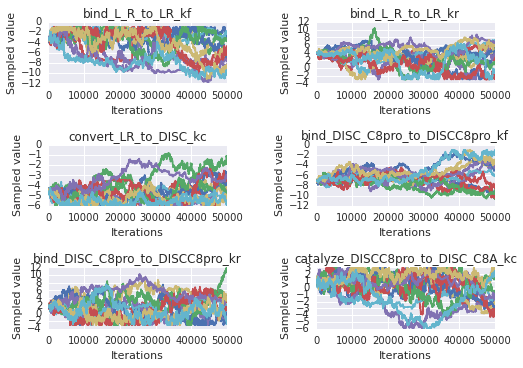

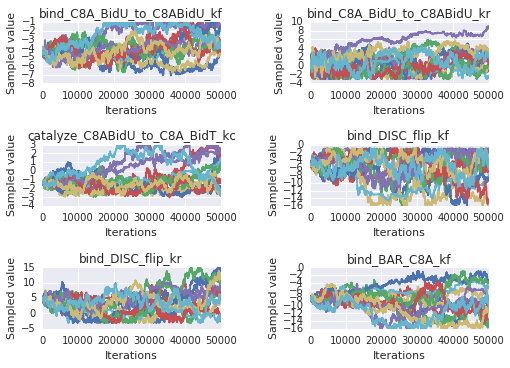

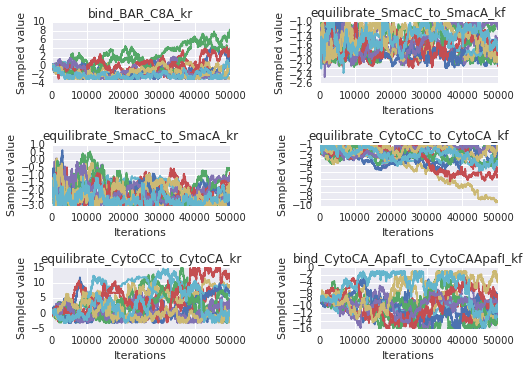

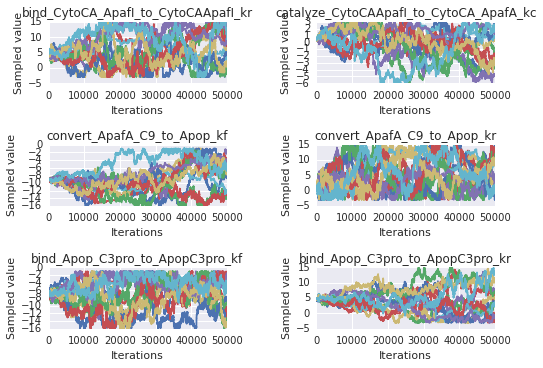

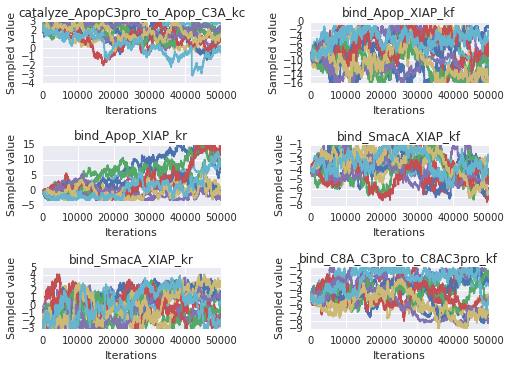

...

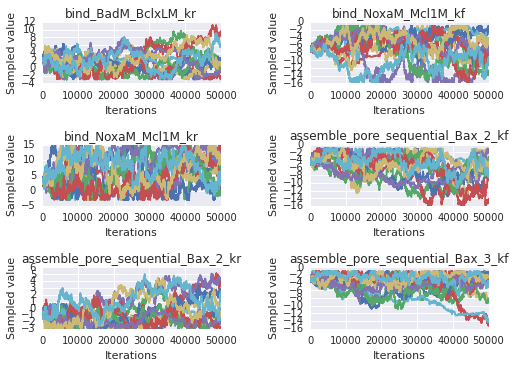

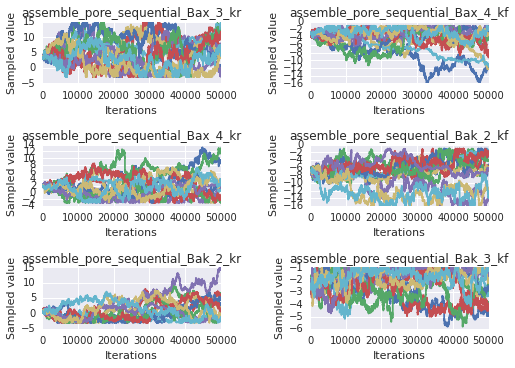

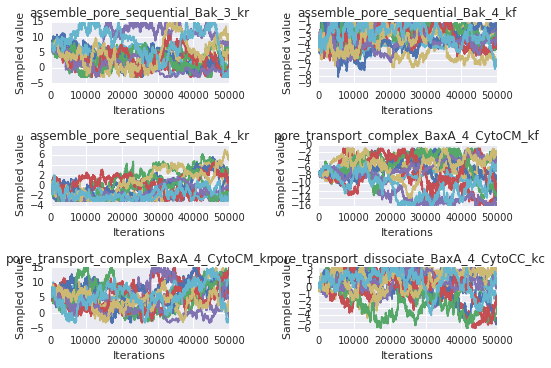

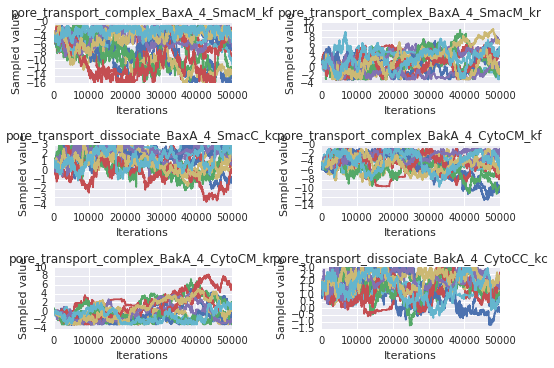

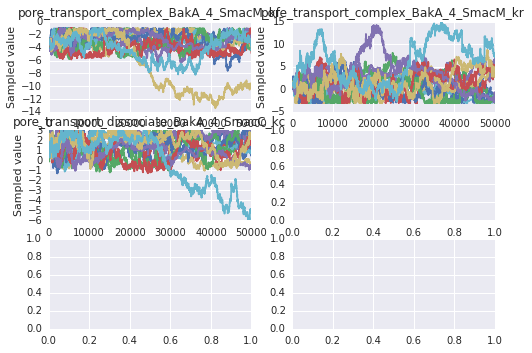

In [29]:
sample_plots(param_trace_dicts['a'])

50000
12
50000


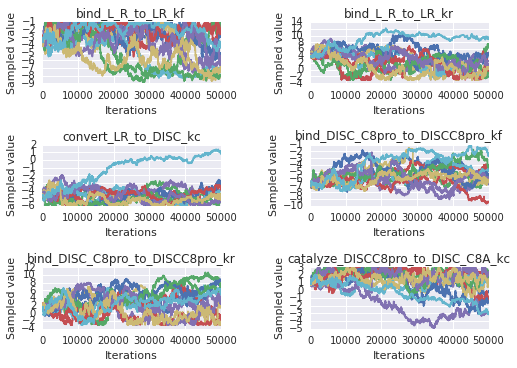

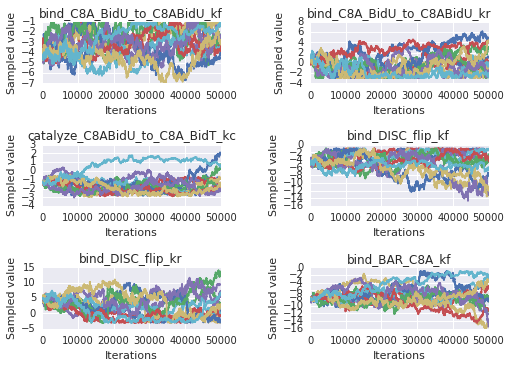

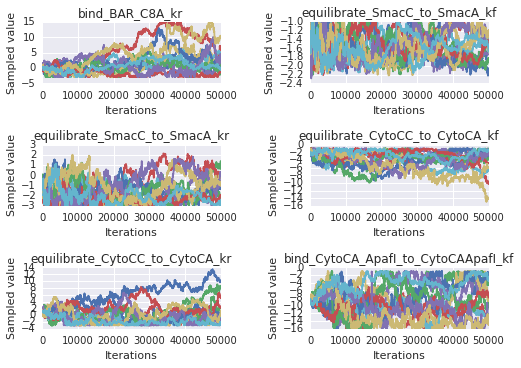

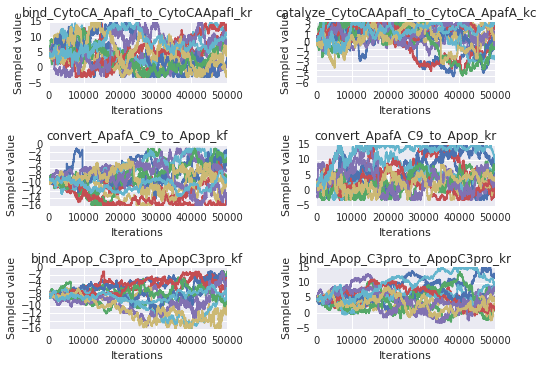

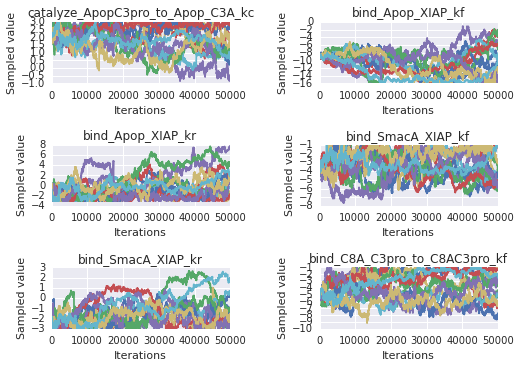

...

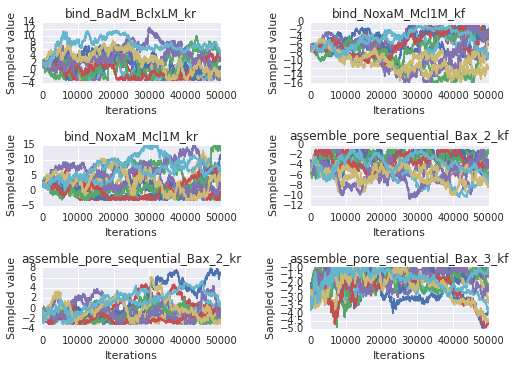

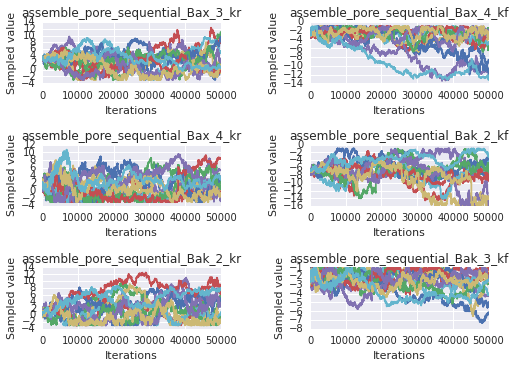

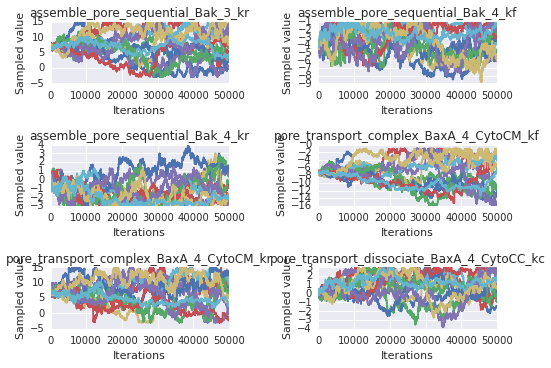

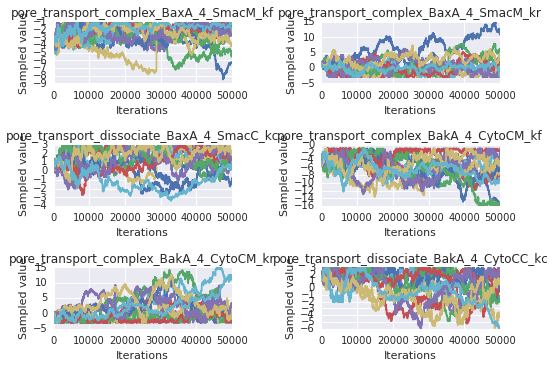

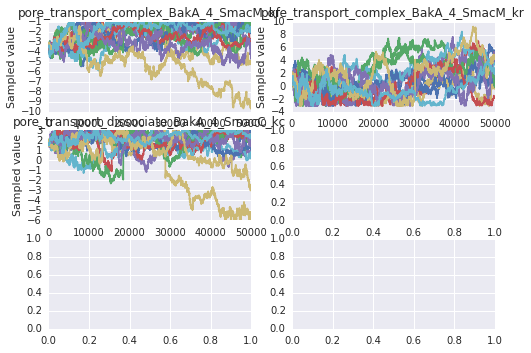

In [30]:
sample_plots(param_trace_dicts['b'])

In [31]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=25000, thin=1)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=25000, thin=1)
#trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=25000, thin=1)
#trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=25000, thin=1)

In [32]:
trace_arr_a_short = create_trace_matrix(param_trace_dicts['a'], burnin=40000, thin=1)
trace_arr_b_short = create_trace_matrix(param_trace_dicts['b'], burnin=40000, thin=1)
#trace_arr_c_short = create_trace_matrix(param_trace_dicts['c'], burnin=40000, thin=1)
#trace_arr_d_short = create_trace_matrix(param_trace_dicts['d'], burnin=40000, thin=1)

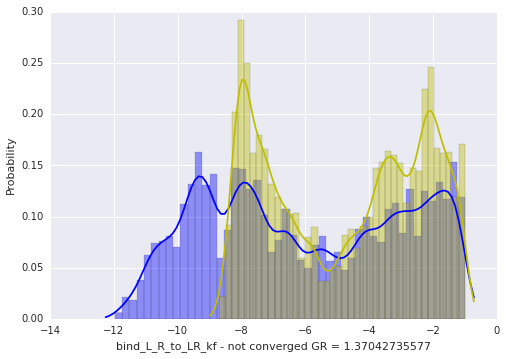

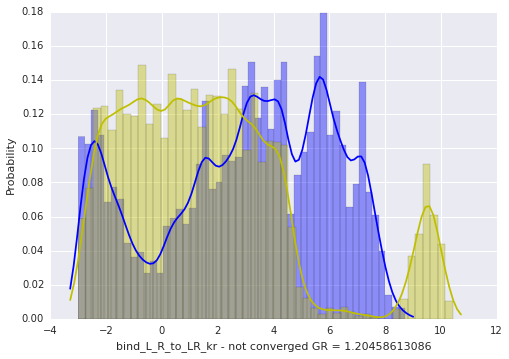

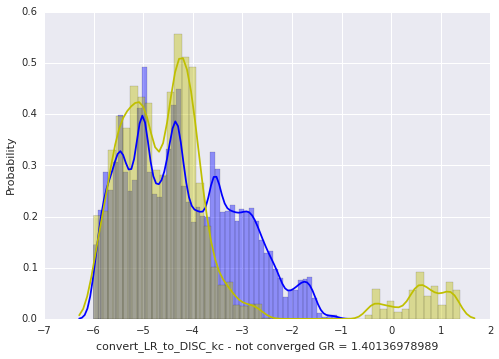

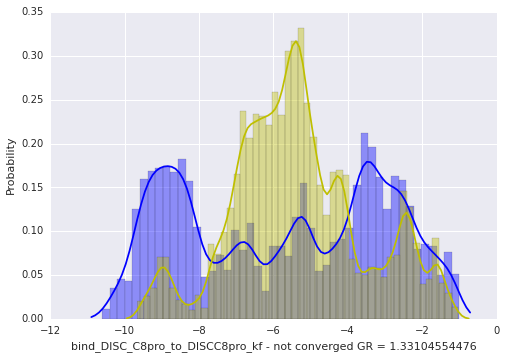

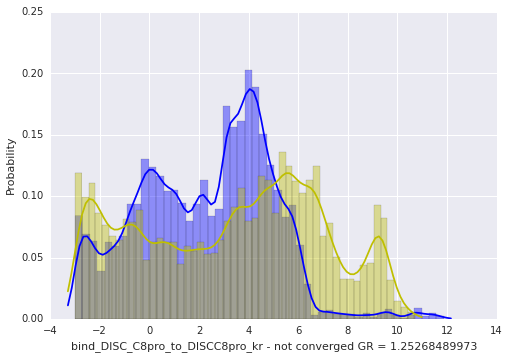

...

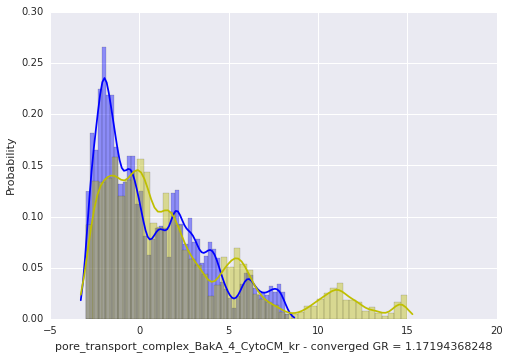

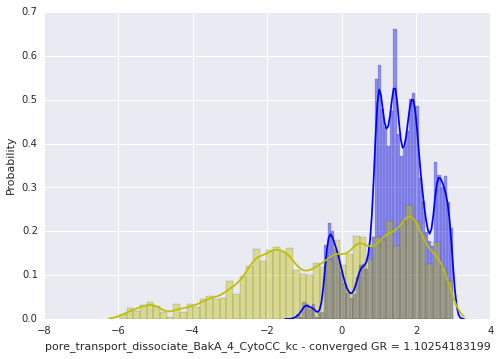

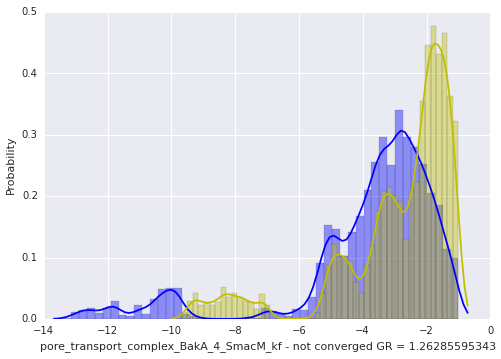

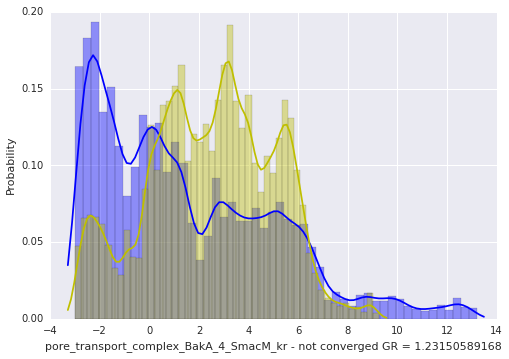

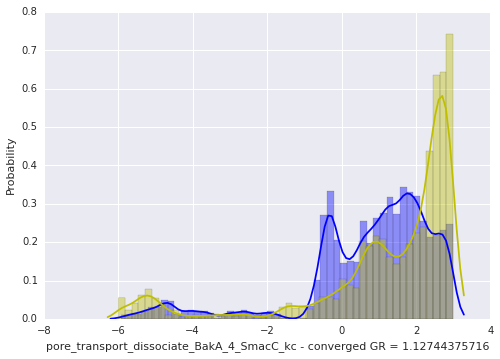

In [33]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a_short[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b_short[:,dim], hist=True, color='y')
    #sns.distplot(trace_arr_c_short[:,dim], hist=True, color='r')
    #sns.distplot(trace_arr_d_short[:,dim], hist=True, color='g')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

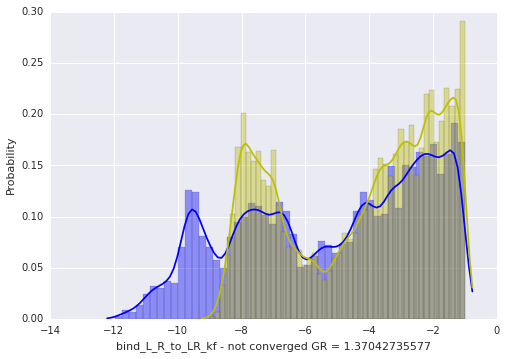

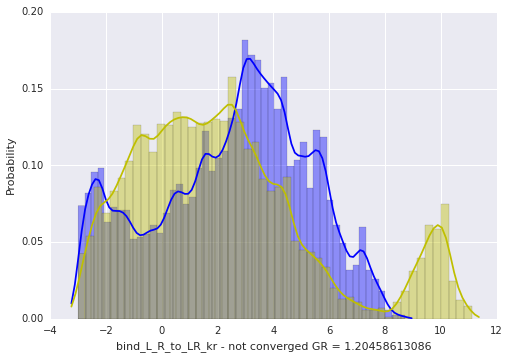

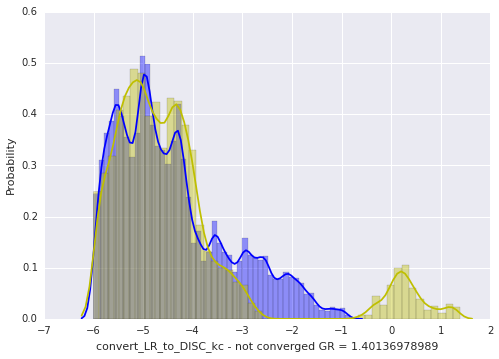

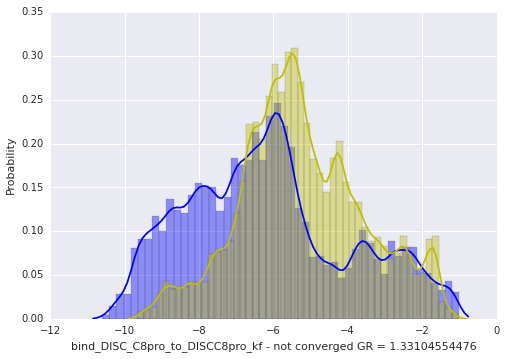

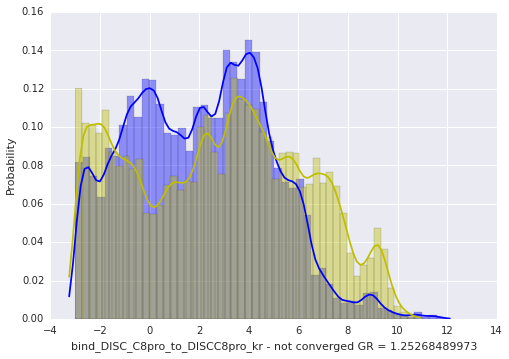

...

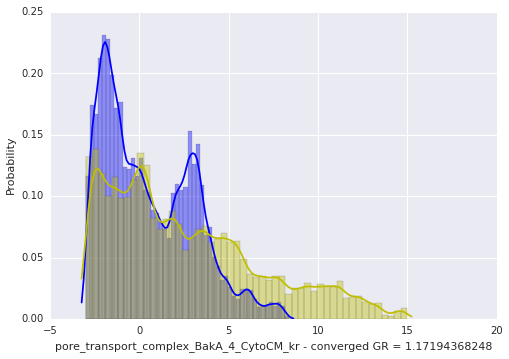

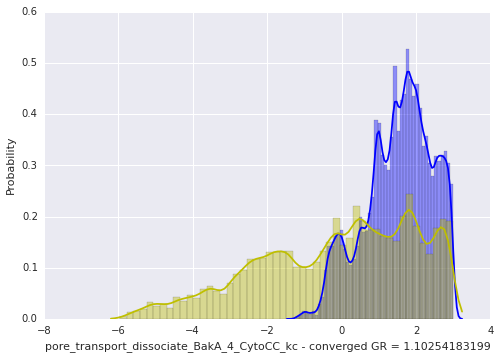

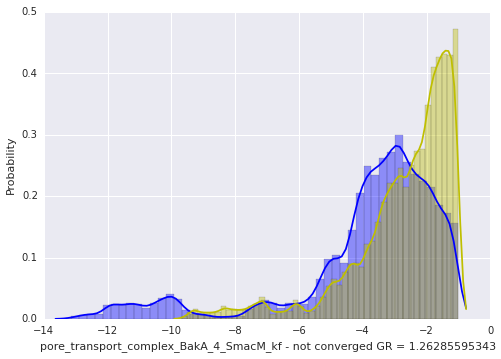

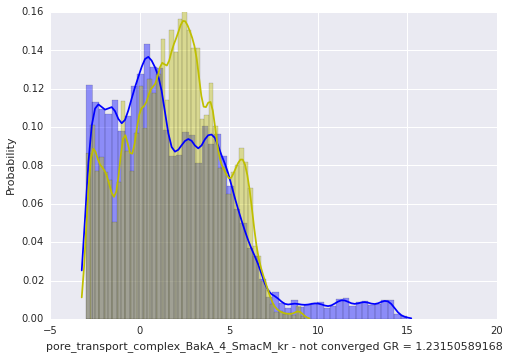

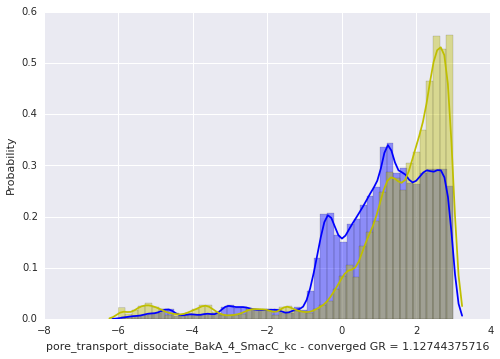

In [34]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b[:,dim], hist=True, color='y')
    #sns.distplot(trace_arr_c[:,dim], hist=True, color='r')
    #sns.distplot(trace_arr_d[:,dim], hist=True, color='g')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

In [35]:
traces['a'][1][:,0]

array([-3.6304606 , -3.6304606 , -3.6304606 , ..., -6.53683891,
       -6.53683891, -6.53683891])

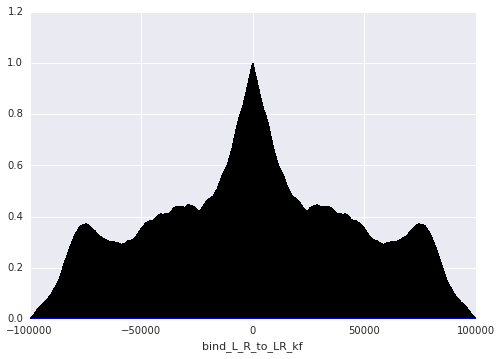

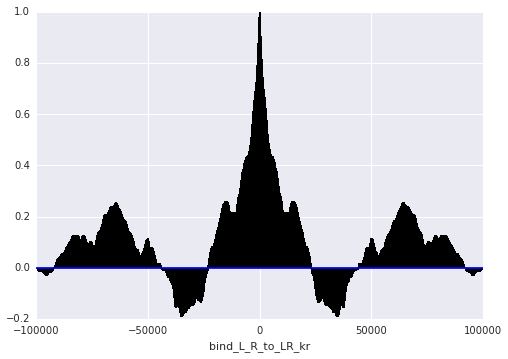

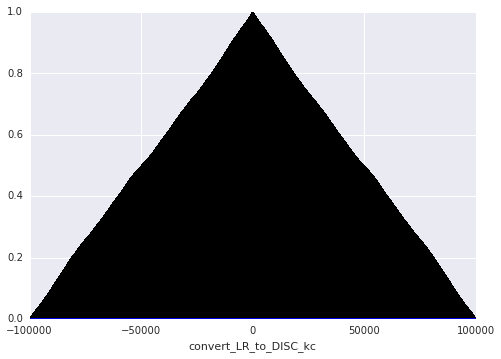

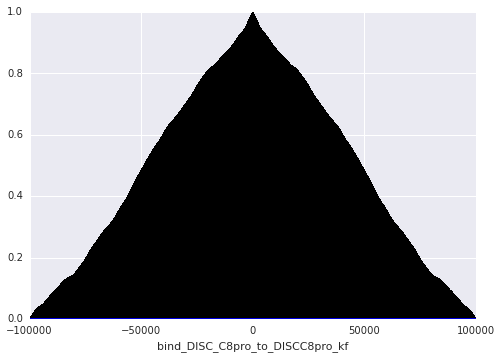

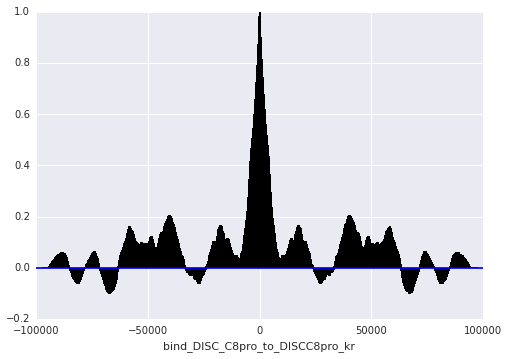

...

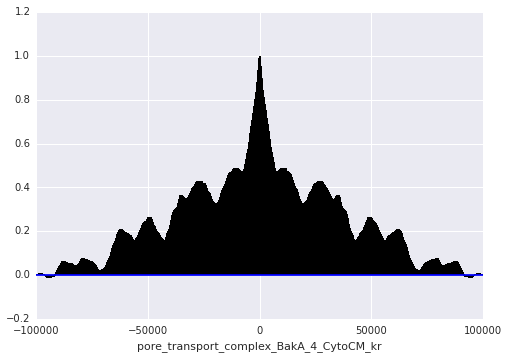

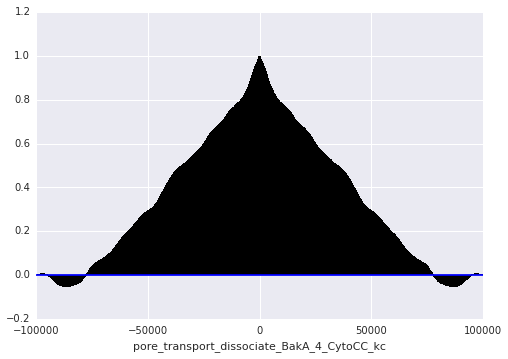

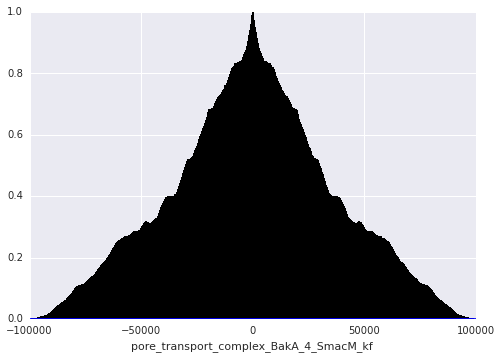

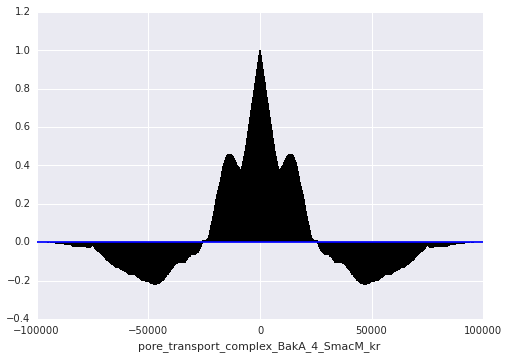

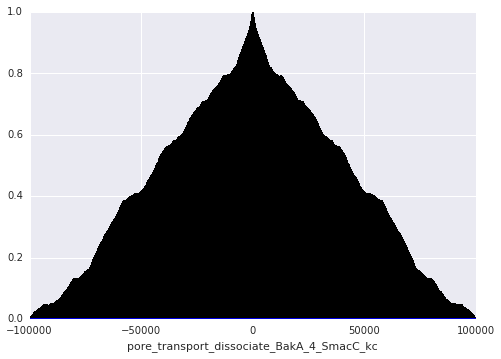

In [28]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['c'][0][50000:,dim], maxlags=None)
    plt.xlabel(str(param_name))

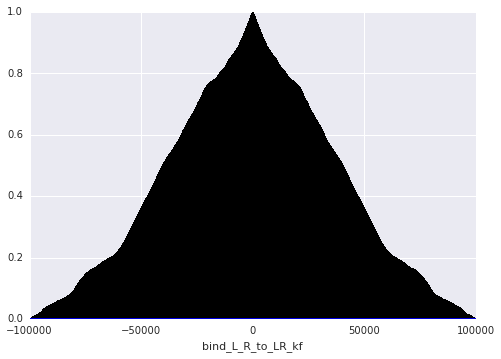

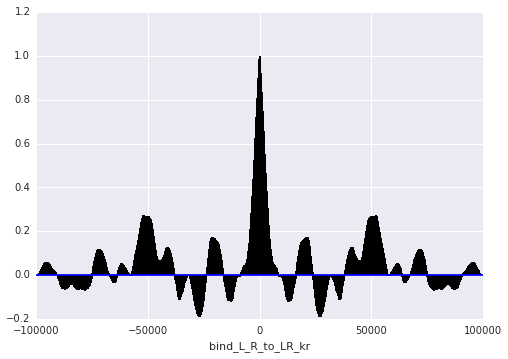

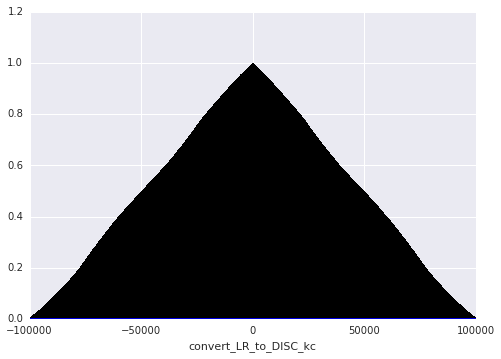

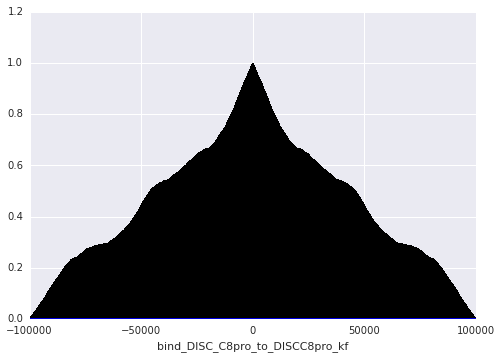

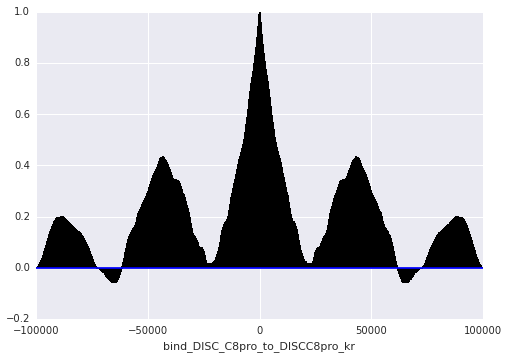

...

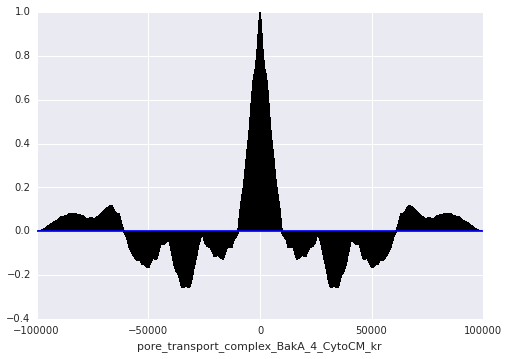

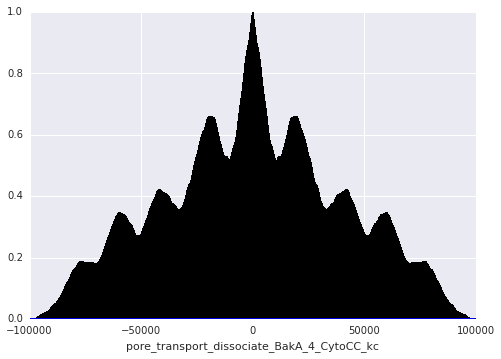

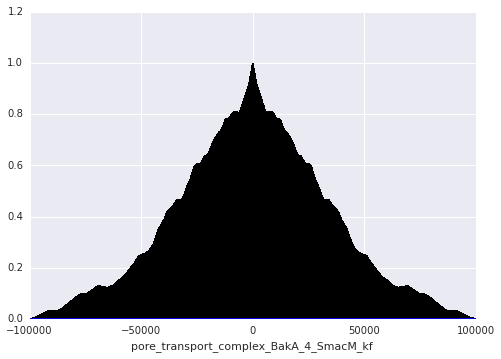

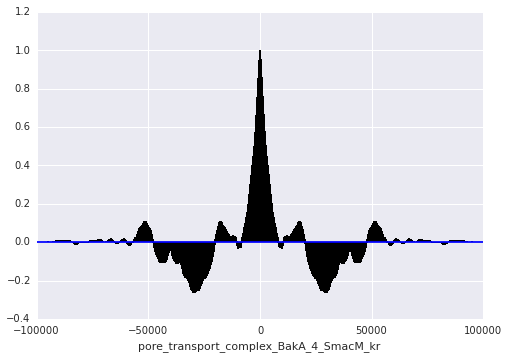

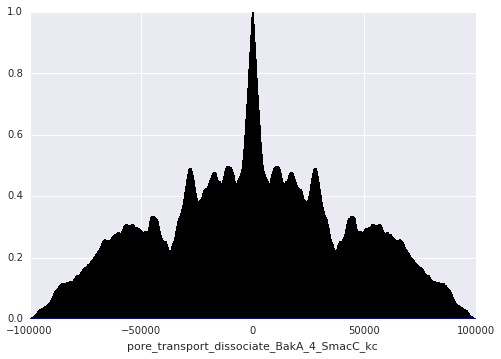

In [29]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['c'][1][50000::,dim], maxlags=None)
    plt.xlabel(str(param_name))

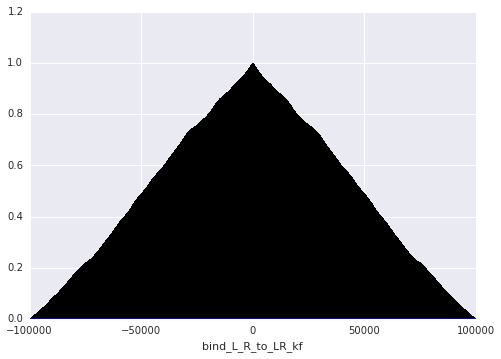

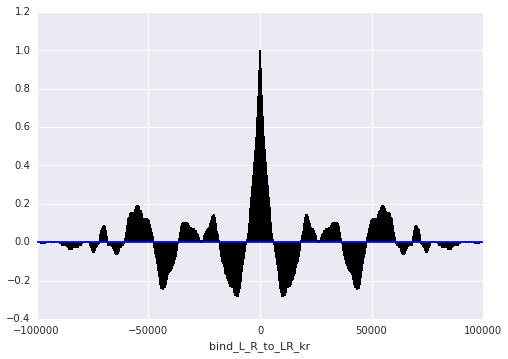

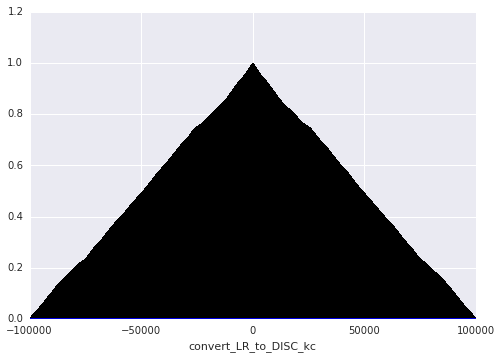

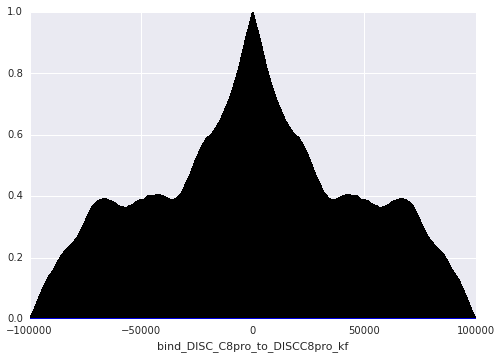

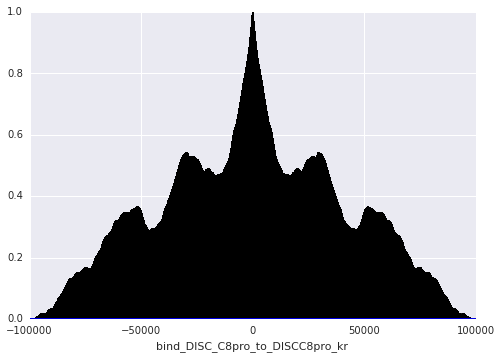

...

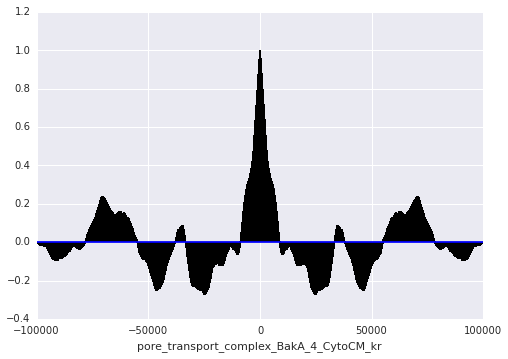

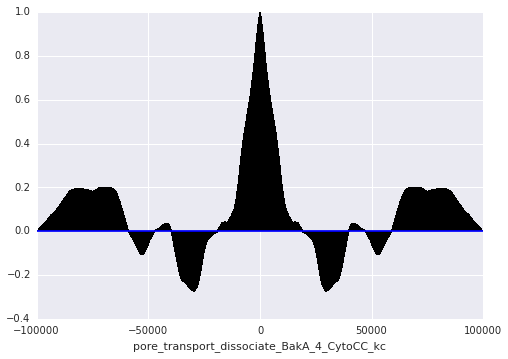

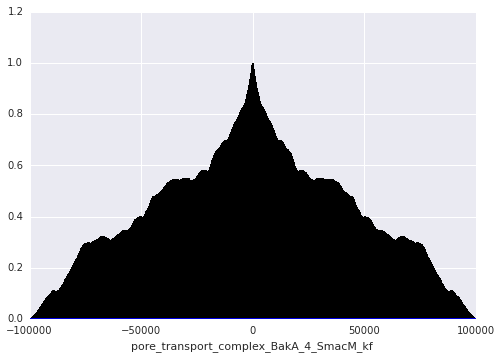

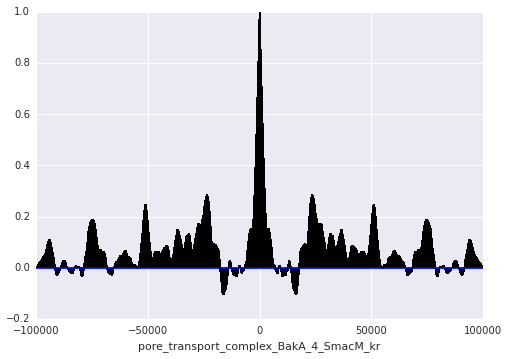

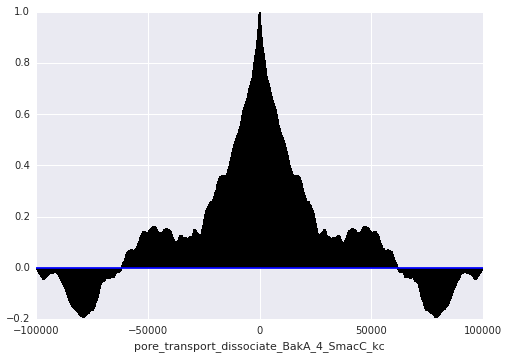

In [30]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['c'][2][50000:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [32]:
os.chdir('/Users/Erin/git/emcee/')
from emcee import autocorr

In [44]:
range(1, 15+1)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

In [36]:
windows=15
integrated_autocorr_times = {}
for trace in ['a', 'b', 'c']:
    integrated_autocorr_times[trace] = {}
    for chain in range(12):
        integrated_autocorr_times[trace][chain] = np.zeros((windows, 105))
        window_length = int(len(traces[trace][chain][25000::])/windows)
        start = 25000
        for window in range(windows):
            end = start + window_length
            integrated_autocorr_times[trace][chain][window] = autocorr.integrated_time(traces[trace][chain][start:end], window=500)
            start = end
integrated_autocorr_times

NameError: name 'autocorr' is not defined

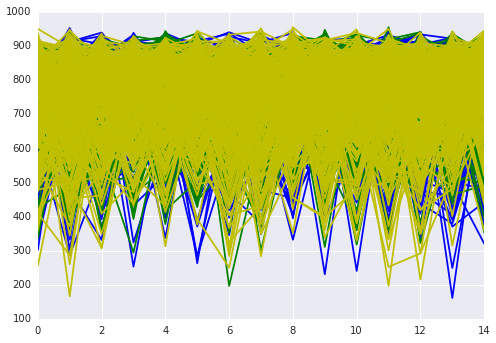

In [53]:
for trace in ['a', 'b', 'c']:
    for chain in range(3):
        for dim in range(105):
            if trace == 'a':
                plt.plot(range(15), integrated_autocorr_times[trace][chain][:,dim], 'b')
            elif trace == 'b':
                plt.plot(range(15), integrated_autocorr_times[trace][chain][:,dim], 'g')
            elif trace == 'c':
                plt.plot(range(15), integrated_autocorr_times[trace][chain][:,dim], 'y')

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [37]:
acceptance_rates = {}
vector_acceptance_rate = {}
running_acceptance_rates = {}
running_acceptance_rates_100window = {}
n_vector_acceptances = {}
n_100windowvec_acceptances = {}
running_acceptance_rates_vec = {}
running_acceptances_rates_vec_100window = {}
n_100window_acceptances = {}
n_acceptances = {}
for run in ['a', 'b']:
    acceptance_rates[run] = {}
    vector_acceptance_rate[run] = {}
    running_acceptance_rates[run] = {}
    running_acceptance_rates_100window[run] = {}
    n_vector_acceptances[run] = {}
    n_100windowvec_acceptances[run] = {}
    running_acceptance_rates_vec[run] = {}
    running_acceptances_rates_vec_100window[run] = {}
    n_100window_acceptances[run] = {}
    n_acceptances[run] = {}
    for chain in range(len(traces[run])):
        acceptance_rates[run][chain] = np.zeros((len(traces['a'][0][0],)))
        vector_acceptance_rate[run][chain] = 0
        running_acceptance_rates[run][chain] = np.zeros((len(traces['a'][0][0]), len(traces['a'][0])))
        running_acceptance_rates_100window[run][chain] = np.zeros((len(traces['a'][0][0]), 500))
        n_vector_acceptances[run][chain] = 0
        n_100windowvec_acceptances[run][chain] = 0
        running_acceptance_rates_vec[run][chain] = np.zeros((1, len(traces['a'][0])))
        running_acceptances_rates_vec_100window[run][chain] = np.zeros((1, 500))
        n_100window_acceptances[run][chain] = {}
        n_acceptances[run][chain] = {}
        for dim in range(len(traces[run][chain][0])):
            n_100window_acceptances[run][chain][dim] = 0
            n_acceptances[run][chain][dim] = 0
            for iteration in range(1, len(traces[run][chain])):
                if dim == 0:
                    comparison = traces[run][chain][iteration] == traces[run][chain][iteration-1]
                    if not np.all(comparison):
                        n_vector_acceptances[run][chain] += 1
                        n_100windowvec_acceptances[run][chain] += 1
                    running_acceptance_rates_vec[run][chain][0, iteration] = float(n_vector_acceptances[run][chain])/iteration
                    if iteration % 100 == 0:
                        running_acceptances_rates_vec_100window[run][chain][0, iteration/100] = float(n_100windowvec_acceptances[run][chain])/100
                        n_100windowvec_acceptances[run][chain] = 0
                if traces[run][chain][iteration][dim] != traces[run][chain][iteration-1][dim]:
                    n_acceptances[run][chain][dim] += 1
                    n_100window_acceptances[run][chain][dim] += 1
                running_acceptance_rates[run][chain][dim, iteration] = float(n_acceptances[run][chain][dim])/iteration
        
                if iteration % 100 == 0:
                    running_acceptance_rates_100window[run][chain][dim, iteration/100] = float(n_100window_acceptances[run][chain][dim])/100
                    n_100window_acceptances[run][chain][dim] = 0
            
            acceptance_rates[run][chain][dim] = float(n_acceptances[run][chain][dim])/len(traces[run][chain])
            print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances[run][chain][dim]),' acceptance rate: ',str(acceptance_rates[run][chain][dim])
        print 'n vector acceptances: ',n_vector_acceptances[run][chain],' for run: ',run,' and chain: ',chain
        print 'Acceptance rate for vector: ',float(n_vector_acceptances[run][chain])/len(traces[run][chain]),' for run: ',run,' and chain: ',chain
running_acceptance_rates
running_acceptance_rates_100window
running_acceptance_rates_vec
running_acceptances_rates_vec_100window


N acceptances for parameter:  bind_L_R_to_LR_kf  =  9084  acceptance rate:  0.18168
N acceptances for parameter:  bind_L_R_to_LR_kr  =  9082  acceptance rate:  0.18164
N acceptances for parameter:  convert_LR_to_DISC_kc  =  9093  acceptance rate:  0.18186
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  9061  acceptance rate:  0.18122
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  9149  acceptance rate:  0.18298
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  9102  acceptance rate:  0.18204
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  9049  acceptance rate:  0.18098
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  9154  acceptance rate:  0.18308
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  9129  acceptance rate:  0.18258
N acceptances for parameter:  bind_DISC_flip_kf  =  9129  acceptance rate:  0.18258
N acceptances for parameter:  bind_DISC_flip_kr  =  9199  acceptance rate:  0.

{'a': {0: array([[ 0.  ,  0.31,  0.59,  0.67,  0.53,  0.47,  0.65,  0.68,  0.51,
           0.51,  0.52,  0.56,  0.57,  0.39,  0.66,  0.52,  0.4 ,  0.53,
           0.49,  0.68,  0.68,  0.59,  0.54,  0.61,  0.61,  0.49,  0.56,
           0.54,  0.43,  0.57,  0.44,  0.49,  0.38,  0.48,  0.41,  0.47,
           0.35,  0.38,  0.42,  0.21,  0.49,  0.43,  0.26,  0.36,  0.34,
           0.35,  0.31,  0.25,  0.34,  0.38,  0.38,  0.28,  0.31,  0.47,
           0.5 ,  0.39,  0.43,  0.48,  0.48,  0.47,  0.42,  0.49,  0.37,
           0.36,  0.36,  0.36,  0.4 ,  0.41,  0.35,  0.39,  0.32,  0.39,
           0.34,  0.37,  0.2 ,  0.31,  0.3 ,  0.33,  0.38,  0.48,  0.33,
           0.38,  0.34,  0.32,  0.41,  0.42,  0.39,  0.4 ,  0.45,  0.4 ,
           0.48,  0.46,  0.39,  0.3 ,  0.26,  0.32,  0.26,  0.29,  0.29,
           0.35,  0.32,  0.29,  0.2 ,  0.26,  0.4 ,  0.3 ,  0.23,  0.26,
           0.24,  0.15,  0.23,  0.19,  0.15,  0.16,  0.19,  0.16,  0.11,
           0.14,  0.11,  0.2 ,  0.2 ,  0.24

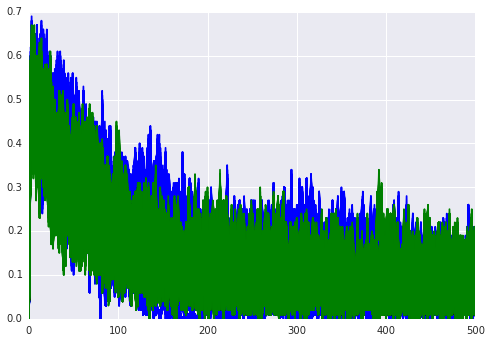

In [38]:
for run in ['a', 'b']:
    for chain in range(len(traces[run])):
        for dim in range(105):
            if run == 'a':
                plt.plot(range(500), running_acceptance_rates_100window[run][chain][dim, :], 'b')
            elif run == 'b':
                plt.plot(range(500), running_acceptance_rates_100window[run][chain][dim, :], 'g')
            elif run == 'c':
                plt.plot(range(500), running_acceptance_rates_100window[run][chain][dim, :], 'r')
            elif run == 'd':
                plt.plot(range(500), running_acceptance_rates_100window[run][chain][dim, :], 'y')

In [25]:
adapted_crossover_vals = {}
adapted_gamma_vals = {}
joint_probs = {}
for run in ['a', 'b']:
    adapted_gamma_vals[run] = np.load('earm_mtdreamzs_3chain_uniform_gammalevels_25000burnin_'+run+'_DREAM_chain_adapted_gammalevelprob.npy')
    adapted_crossover_vals[run] = np.load('earm_mtdreamzs_3chain_uniform_gammalevels_25000burnin_'+run+'_DREAM_chain_adapted_crossoverprob.npy')
    #joint_probs[run] = adapted_crossover_vals[run]*[adapted_gamma_vals[run][level] for level in range(len(adapted_gamma_vals[run]))]


In [26]:
adapted_crossover_vals

{'a': array([ 0.26511556,  0.23853595,  0.49634849]),
 'b': array([  1.43018899e-05,   2.98577311e-01,   7.01408387e-01]),
 'c': array([ 0.14644888,  0.19418167,  0.65936946])}

In [27]:
adapted_gamma_vals

{'a': array([ 0.48420182,  0.24993772,  0.1260606 ,  0.13979985]),
 'b': array([  5.66577404e-01,   4.33316177e-01,   1.70948657e-05,
          8.93246938e-05]),
 'c': array([  5.37887894e-23,   2.49438741e-01,   7.01272817e-01,
          4.92884419e-02])}